# iSEE-CustonPanel-CorrelationPlot

In [1]:
library(SummarizedExperiment)
library(iSEE)
library(corrplot)

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges, rowRanks,
    rowSdDiffs, rowSds, rowSums2, ro

## Import Data

In [2]:
se <- readRDS("../data/pilot_MPRA_SE.rds")
hepg2_se <- se$pilot_HepG2

In [3]:
colData(hepg2_se)$replicate_status <- row.names(colData(hepg2_se))

In [4]:
assays(hepg2_se)$'log2-ActivityScore' <- log2(assays(hepg2_se)$ActivityScore)

In [5]:
x <- SampleAssayPlot(YAxisSampleName='rep1',
                XAxis='Sample name',
                XAxisSampleName='rep2',
                Assay='log2-ActivityScore')

sce0 <- .cacheCommonInfo(x, hepg2_se)
# .refineParameters(x, sce0)
.fullName(x)

# initialPanels = DataFrame(
    # Name = c(sprintf("Sample Assay Plot: Biological Correlation %i", 1)
            # )

[1] "Sample assay plot"

In [18]:
.fullName(x)

[1] "Sample assay plot"

In [6]:
app <- iSEE(hepg2_se, initial=list(x), appTitle='MPRAbase')

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon

The `name` provided ('') does not correspond to a known icon



In [ ]:
shiny::runApp(app, port = 3838, host = "0.0.0.0")

Loading required package: shiny


Listening on http://0.0.0.0:3838



## Custom Correlation Panel iSEE Function

In [41]:
CUSTOM_CORRELATION <- function(se){
    
    # Create matrix of all possible replicate pairs
    n_replicates <- ncol(se)
    selected_pairs <- combn(1:n_replicates,2)

    # Configure panel size for figure
    par(mfrow=c(2,2))
    
    ratio <- assays(se)$ActivityScore
    
    for(i in 1:n_replicates){
        i_replicate_pair = selected_pairs[,i]
        plot(log2(ratio[,i_replicate_pair[1]]),
             log2(ratio[,i_replicate_pair[2]]),
             
             main=sprintf("ratio %s vs %s\n(p-rho %.2f, s-rho %.2f)",
                          i_replicate_pair[1],
                          i_replicate_pair[2],
                          
                          cor(log2(ratio[,i_replicate_pair[1]]),
                              log2(ratio[,i_replicate_pair[2]]),
                              method="pearson"),
                          
                          cor(ratio[,i_replicate_pair[1]],
                              ratio[,i_replicate_pair[2]],
                              method="spearman")),
             
             xlab=sprintf("rep%s log2 ratio",i_replicate_pair[1]),
             ylab=sprintf("rep%s log2 ratio",i_replicate_pair[2]),
             pch=19, cex=0.3, col = "darkred", las=1, cex.axis=1.3, cex.lab=1.3, cex.main=1.2)
        abline(0,1,lty=2)
    }
}
cdp <- createCustomPlot(CUSTOM_CORRELATION)

In [50]:
# Create iSEE app with custom plot
app <- iSEE(sce, initial = list(cdp))
shiny::runApp(app, port = 3838, host = "0.0.0.0")

In [42]:
CUSTOM_COR <- function(){
rep=ncol(ratio)
selected <- combn(1:rep,2)
par(mfrow=c(2,2))
for(i in 1:rep) {
   selSamples=selected[,i]
   plot(log2(ratio[,selSamples[1]]),log2(ratio[,selSamples[2]]), 
     main=sprintf("ratio %s vs %s\n(p-rho %.2f, s-rho %.2f)",selSamples[1],selSamples[2], 
     cor(log2(ratio[,selSamples[1]]),log2(ratio[,selSamples[2]]),method="pearson"), 
                  cor(ratio[,selSamples[1]],ratio[,selSamples[2]],method="spearman")), 
     xlab=sprintf("rep%s log2 ratio",selSamples[1]), ylab=sprintf("rep%s log2 ratio",selSamples[2]), 
     pch=19, cex=0.3, col = "darkred", las=1, cex.axis=1.3, cex.lab=1.3, cex.main=1.2)
    abline(0,1,lty=2)
    }
}
# GENERATOR <- createCustomPlot(CUSTOM_COR)
# coorelation_panel <- GENERATOR()

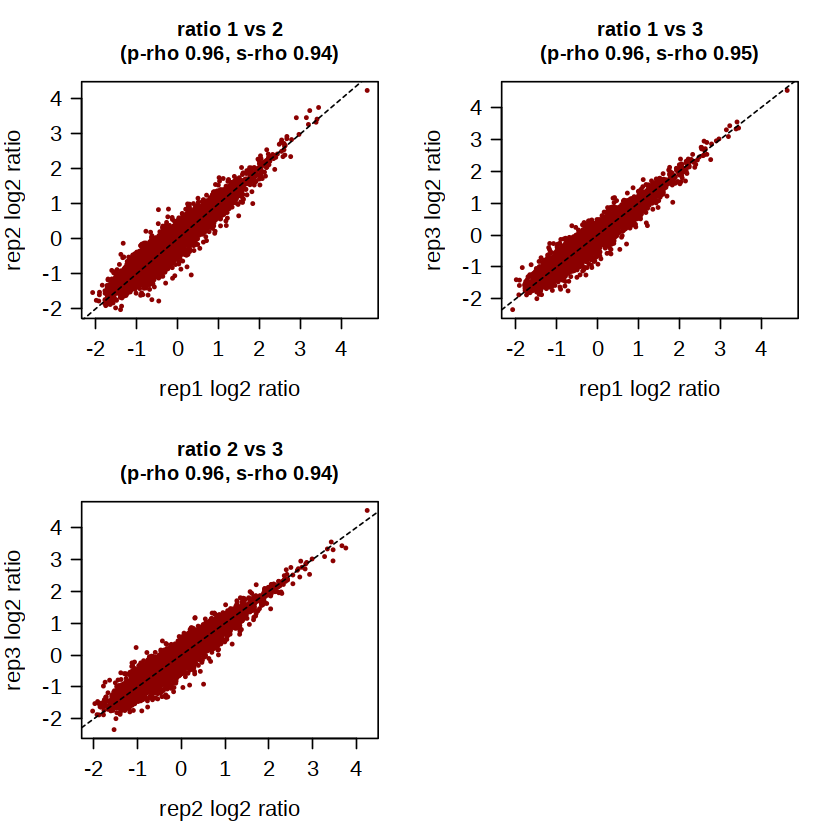

In [53]:
ratio=assays(hepg2_se)$ActivityScore

# Create matrix of all possible replicate pairs
n_replicates <- ncol(hepg2_se)
selected_pairs <- combn(1:n_replicates,2)

# Configure panel size for figure
par(mfrow=c(2,2))

for(i in 1:n_replicates) {
    i_replicate_pair = selected_pairs[,i]
    
   plot(log2(ratio[,i_replicate_pair[1]]),log2(ratio[,i_replicate_pair[2]]), 
     main=sprintf("ratio %s vs %s\n(p-rho %.2f, s-rho %.2f)",
                  i_replicate_pair[1], 
                  i_replicate_pair[2], 
     cor(log2(ratio[,i_replicate_pair[1]]),log2(ratio[,i_replicate_pair[2]]),method="pearson"), 
                  cor(ratio[,i_replicate_pair[1]],ratio[,i_replicate_pair[2]],method="spearman")), 
     
        xlab=sprintf("rep%s log2 ratio",i_replicate_pair[1]),
        ylab=sprintf("rep%s log2 ratio",i_replicate_pair[2]), 
     pch=19, cex=0.3, col = "darkred", las=1, cex.axis=1.3, cex.lab=1.3, cex.main=1.2)
    
    abline(0,1,lty=2)
    }


In [6]:
# Iterating over replicate_status from colData
# Subsetting SE by replicate and pulling assay ActivityScore slot
for (rep in colnames(hepg2_se)){
    print(head(assays(hepg2_se[,hepg2_se$replicate_status == rep])$ActivityScore))
    print(dim(assays(hepg2_se[,hepg2_se$replicate_status == rep])$ActivityScore))
}

In [7]:
colnames(hepg2_se)

In [8]:
hepg2_se[,hepg2_se$replicate_status == 'rep1']

In [21]:
hepg2_se
# colData -> replicate
# assays -> activity scores

In [ ]:
colData(se$pilot_HepG2)

In [8]:
SE1=se[[1]]
ratio=assays(SE1)$ActivityScore

In [9]:
cor_matrix <- cor(ratio)

# Create custom plot generator
CUSTOM_COR <- function(cor_matrix) {
  corrplot(cor_matrix, method = "number", type = "upper", order = "hclust", tl.col = "black", addCoef.col = "black", cl.pos = "n")
}
GENERATOR <- createCustomPlot(CUSTOM_COR)
# Generate custom plot
# cor_panel <- GENERATOR()



In [7]:
shiny::runApp(app, port = 3838, host = "0.0.0.0")

In [33]:
CUSTOM_SUMMARY <- function(se, ri, ci, assay="logcounts", min_exprs=0) {
    if (is.null(ri)) {
        ri <- rownames(se)
    } else {
        ri <- unique(unlist(ri))
    }
    if (is.null(ci)) {
        ci <- colnames(se)
    } else {
        ci <- unique(unlist(ci))
    }
    
    assayMatrix <- assay(se, assay)[ri, ci, drop=FALSE]
    
    data.frame(
        Mean = rowMeans(assayMatrix),
        Var = rowVars(assayMatrix),
        Sum = rowSums(assayMatrix),
        n_detected = rowSums(assayMatrix > min_exprs),
        row.names = ri
    )
}
GENERATOR <- createCustomTable(CUSTOM_SUMMARY)
custom.t <- GENERATOR(PanelWidth=8L,
    ColumnSelectionSource="ReducedDimensionPlot1",
    SearchColumns=c("", "17.8 ... 10000", "", "") # filtering for HVGs.
) 
class(custom.t)
#> [1] "CustomTable"
#> attr(,"package")
#> [1] ".GlobalEnv"

# Preselecting some points in the reduced dimension plot.
# Again, you don't have to manually create the 'BrushData'!
rdp <- ReducedDimensionPlot(
    PanelId=1L,
    BrushData = list(
        xmin = -44.8, xmax = -14.3, ymin = 7.5, ymax = 47.1, 
        coords_css = list(xmin = 55.0, xmax = 169.0, ymin = 48.0, ymax = 188.0),
        coords_img = list(xmin = 71.5, xmax = 219.7, ymin = 62.4, ymax = 244.4), 
        img_css_ratio = list(x = 1.3, y = 1.29), 
        mapping = list(x = "X", y = "Y"), 
        domain = list(left = -49.1, right = 57.2, bottom = -70.3, top = 53.5), 
        range = list(left = 50.9, right = 566.9, bottom = 603.0, top = 33.1), 
        log = list(x = NULL, y = NULL), 
        direction = "xy", 
        brushId = "ReducedDimensionPlot1_Brush", 
        outputId = "ReducedDimensionPlot1"
    )
)

app <- iSEE(sce, initial=list(rdp, custom.t))

In [37]:
shiny::runApp(app, host = "0.0.0.0")

In [28]:
corrplot(cor_matrix, method = "number", type = "upper", order = "hclust", tl.col = "black", addCoef.col = "black", cl.pos = "n")


In [30]:
rep=ncol(ratio)
selected <- combn(1:rep,2)
par(mfrow=c(2,2))
for(i in 1:rep) {
   selSamples=selected[,i]
   plot(log2(ratio[,selSamples[1]]),log2(ratio[,selSamples[2]]), 
     main=sprintf("ratio rep%s vs rep%s\n(p-rho %.2f, s-rho %.2f)",selSamples[1],selSamples[2], 
     cor(log2(ratio[,selSamples[1]]),log2(ratio[,selSamples[2]]),method="pearson"), 
                  cor(ratio[,selSamples[1]],ratio[,selSamples[2]],method="spearman")), 
     xlab=sprintf("rep%s log2 ratio",selSamples[1]), ylab=sprintf("rep%s log2 ratio",selSamples[2]), 
     pch=19, cex=0.3, col = "darkred", las=1, cex.axis=1.3, cex.lab=1.3, cex.main=1.2)
    abline(0,1,lty=2)
    }